In [104]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage

# Pillow library, to manipulate images
from PIL import Image
from os import walk

#https://github.com/TimChinenov/VaporWaveArt
#https://towardsdatascience.com/image-processing-with-python-5b35320a4f3c

In [105]:
# config
path = r"/Users/johann/PycharmProjects/CiP_tut/Original"
N = 2
figSize = (15, 15)
dpi = 100

In [106]:
# load imgs
f = {}
filenames = walk(path)
shape = {}
index_map = {}
s = 1200
x, y = 0, 0
for _, _, filename in filenames:
    for i, file in enumerate(filename):
        f[file] = np.array(Image.open(path+"/"+file))[y:y+s, x:x+s]
        index_map[i] = file 


In [125]:
def reshape_split(image: np.ndarray, kernel_size: tuple):
#https://towardsdatascience.com/efficiently-splitting-an-image-into-tiles-in-python-using-numpy-d1bf0dd7b6f7
    img_height, img_width, channels = image.shape
    tile_height, tile_width = kernel_size

    tiled_array = image.reshape(img_height // tile_height, tile_height, img_width // tile_width, tile_width, channels)
    tiled_array = tiled_array.swapaxes(0, 2)
    return tiled_array

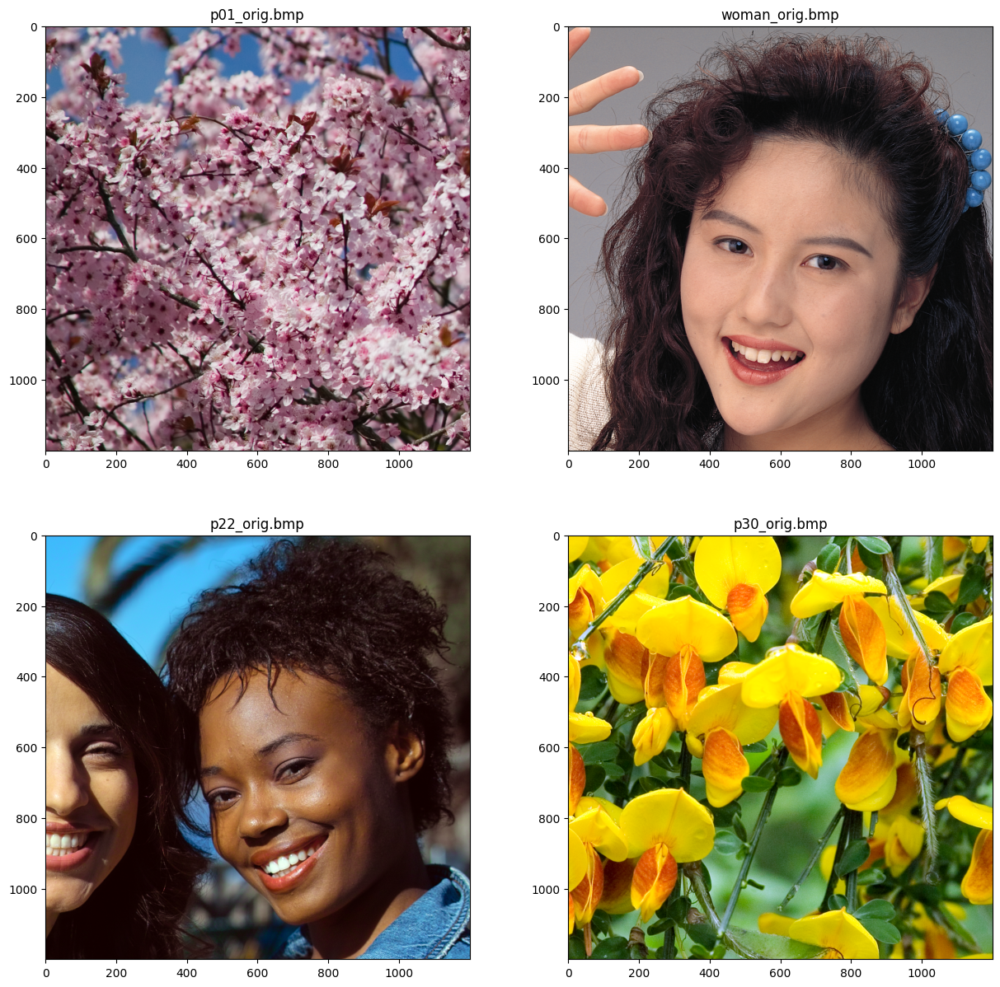

In [108]:
def plot_pictures(N, f, index_map):
    fig, axarr = plt.subplots(N,N, figsize=figSize, dpi=dpi)
    k = 0
    for i in range(0,N):
        for j in range(0,N):
            axarr[i, j].imshow(f[index_map[k]])
            axarr[i, j].set_title(index_map[k])
            k += 1

plot_pictures(N, f, index_map)
#fig.savefig('full_figure.png')

In [109]:
def normalize_to_range(x, endrange):
    """ 
    Function that normalizes an input array or matrix to a desired range 
    using a linear transformation.
    
    A system of two linear equations that map from one range (max-min) 
    to the desired range 
    
    y_min = a*x_min + b
    y_max = a*x_max + b
    
    Two equations with two unknowns. Analytical solutions for a and b are:
    
    a = (y_max - y_min) / (x_max - x_min)
    b = y_max - a*x_max
    
    """
    
    a = (endrange[1] - endrange[0]) / (x.max() - x.min())  
    b = endrange[1] - a*x.max()
    
    return a*x+b 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


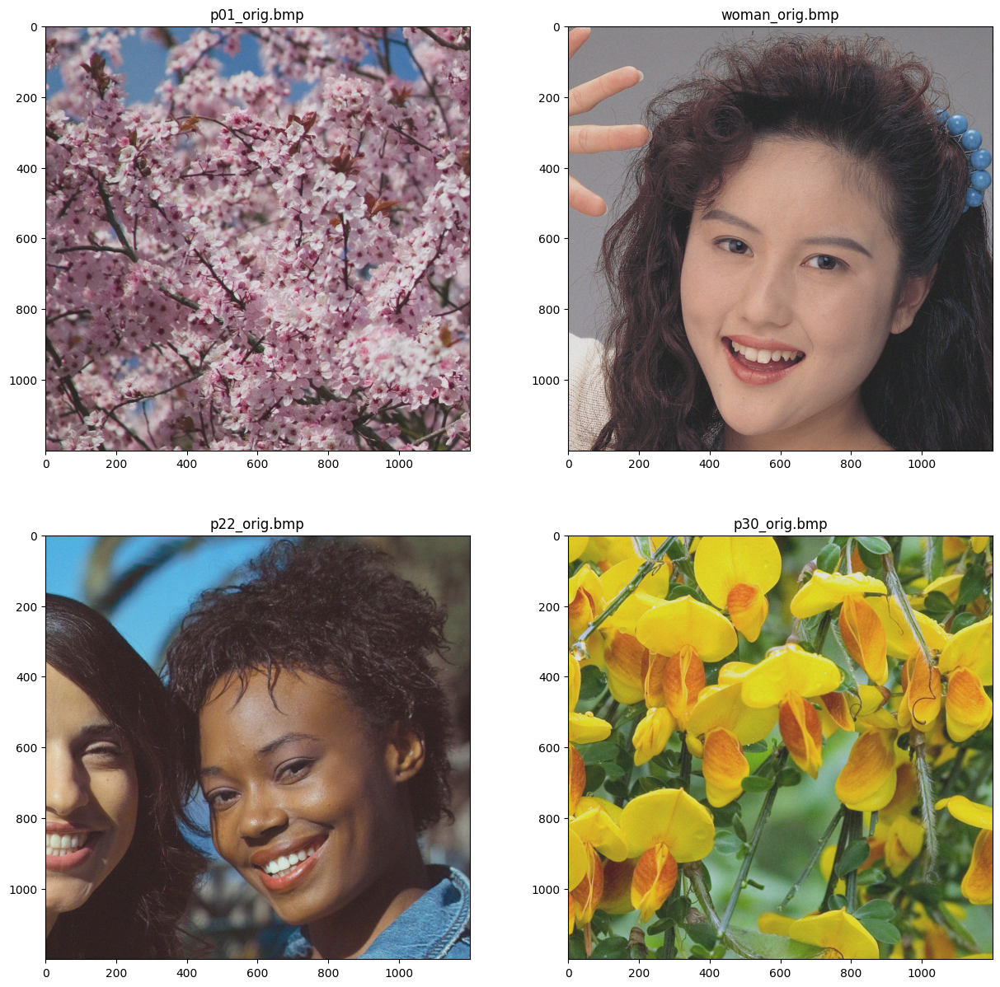

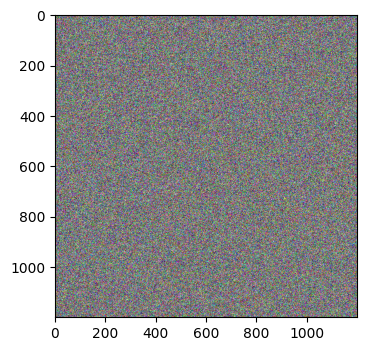

In [110]:
# noise
fig, axarr = plt.subplots(2,2, figsize=figSize, dpi=dpi)
k = 0

sigma = 10
noise = np.random.normal(loc=0, scale=sigma, size=f[index_map[0]].shape)
plt.figure(dpi=dpi)
plt.imshow(noise)

for i in range(0,N):
    for j in range(0,N):
        im = np.round(normalize_to_range(f[index_map[k]].copy()+noise, endrange = (0, 255)), 0).astype(np.int32)
        axarr[i, j].imshow(im, vmin=0, vmax=255)
        axarr[i, j].set_title(index_map[k])
        k += 1

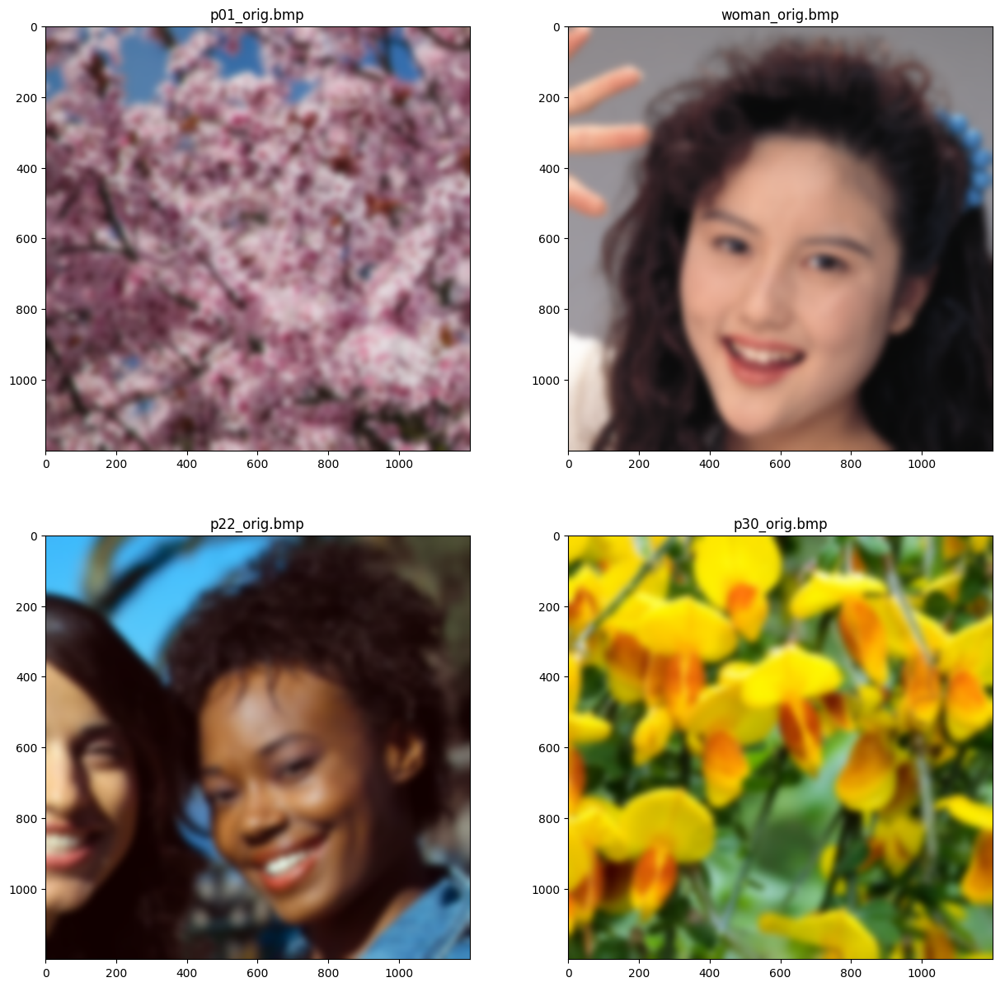

In [111]:
# blur
fig, axarr = plt.subplots(N,N, figsize=figSize, dpi=dpi)
k = 0
for i in range(0,N):
    for j in range(0,N):
        im = f[index_map[k]].copy()
        im = ndimage.gaussian_filter(im, sigma=(10,10,0))
        axarr[i, j].imshow(im, vmin=0, vmax=255)
        axarr[i, j].set_title(index_map[k])
        k += 1

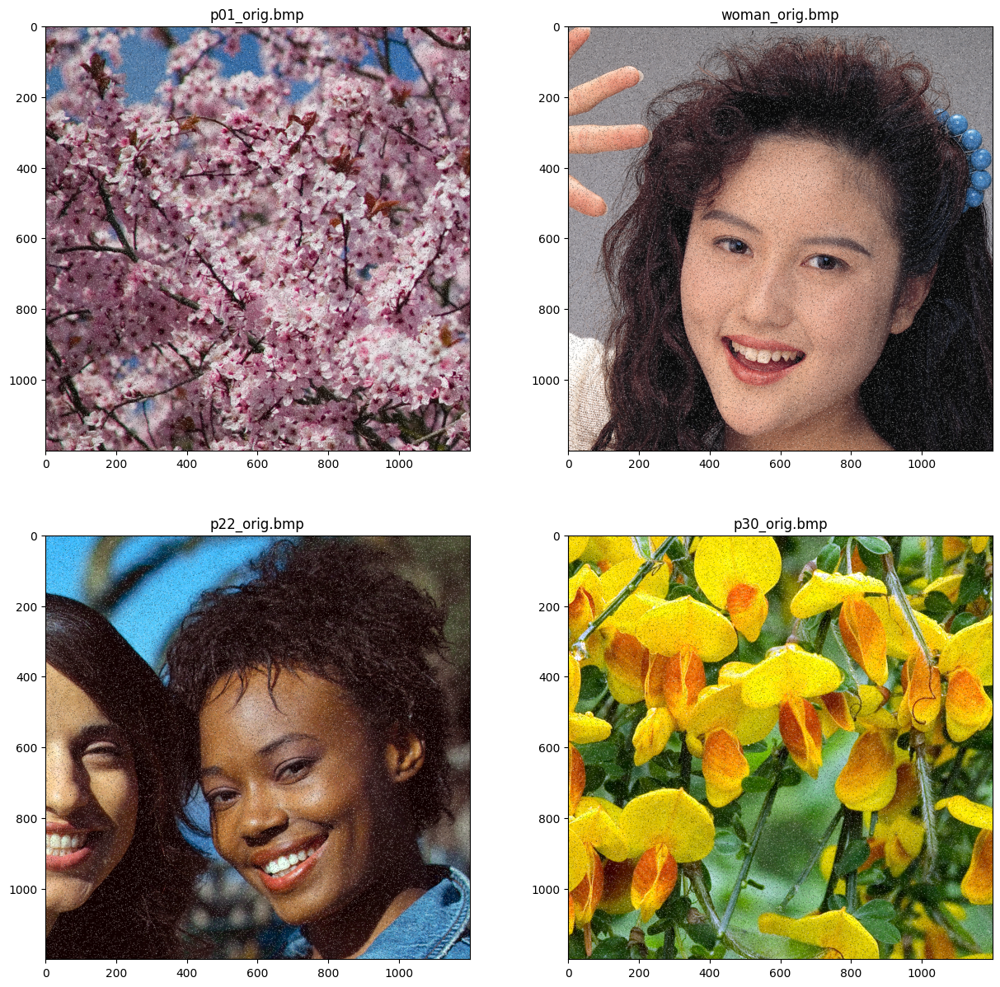

In [112]:
# salt and peper

fig, axarr = plt.subplots(N,N, figsize=figSize, dpi=dpi)
k = 0
n = im.shape[1]
# number of pixels we want to manipulate
m = 10**5
# take a random sample (without replacement) of size NxN out of number of pixels  
spots_x = np.random.choice(range(n), m)
spots_y = np.random.choice(range(n), m)
       
for i in range(0,N):
    for j in range(0,N):
        im = f[index_map[k]].copy() 
        # for each pixel we want to change
        for y in range(m):
            # we randomly assign either 0 (black) or 255 (white)
            im[spots_x[y], spots_y[y]] = np.random.randint(2)*255
        
        axarr[i, j].imshow(im, vmin=0, vmax=255)
        axarr[i, j].set_title(index_map[k])
        k += 1

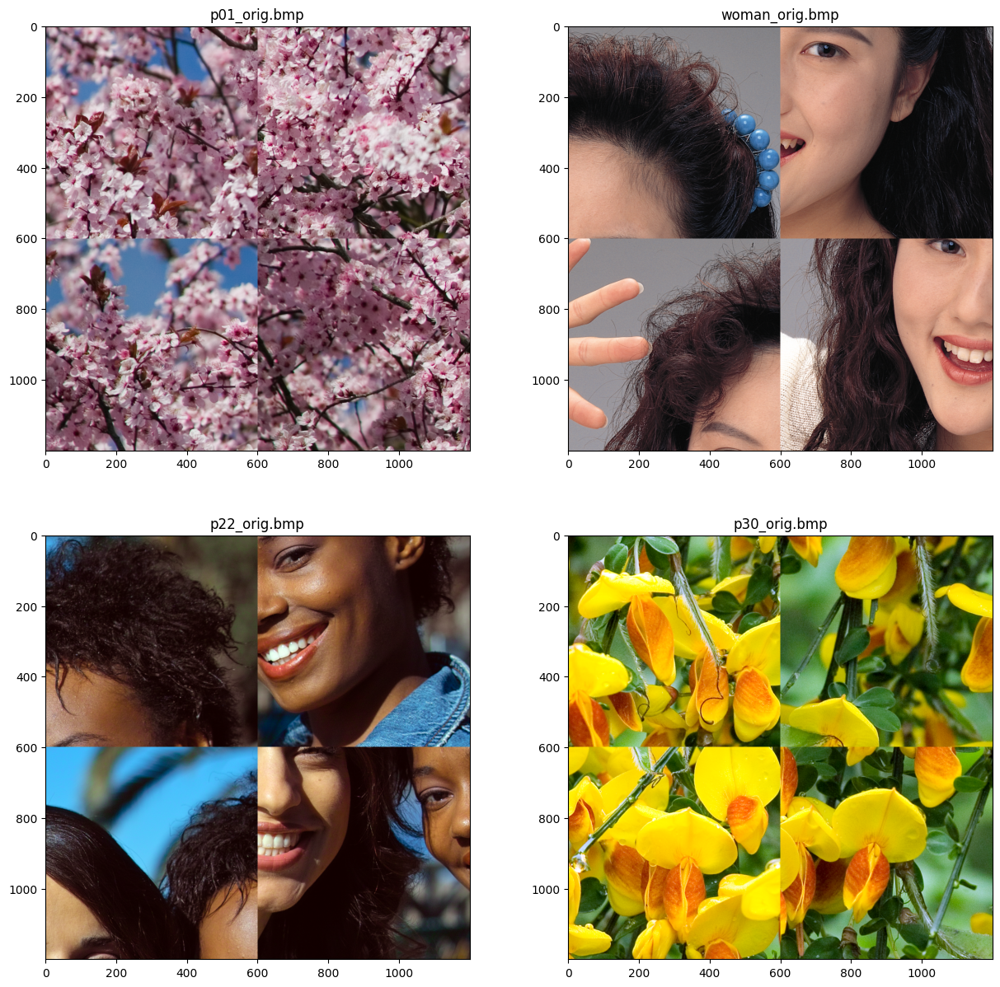

In [124]:
# chunkify

fig, axarr = plt.subplots(N,N, figsize=figSize, dpi=dpi)
k = 0
chunkSize = (600, 600)

for i in range(0,N):
    for j in range(0,N):
        im = f[index_map[k]].copy() 
        im = reshape_split(im, chunkSize)
        np.random.shuffle(im)
        axarr[i, j].imshow(im.reshape(f[index_map[k]].shape), vmin=0, vmax=255)
        axarr[i, j].set_title(index_map[k])
        k += 1

In [ ]:
# rotation
fig, axarr = plt.subplots(N,N, figsize=figSize, dpi=dpi)
k = 0

# we rotate the original image by 90° two times -> 180°
times = 2

for i in range(0,N):
    for j in range(0,N):
        im = f[index_map[k]].copy()
        
        im = np.rot90(im, times)
        
        axarr[i, j].imshow(im, vmin=0, vmax=255)
        axarr[i, j].set_title(index_map[k])
        k += 1